In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns;sns.set()
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
from matplotlib import cm
from pandas import read_csv, set_option
from sklearn.preprocessing import StandardScaler, MinMaxScaler, Normalizer,RobustScaler
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from catboost import CatBoostClassifier,CatBoostRegressor
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor
from sklearn.feature_selection import SelectKBest,f_regression
from xgboost import plot_importance,XGBClassifier,XGBRegressor
from sklearn.model_selection import learning_curve
from sklearn.pipeline import Pipeline
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn import preprocessing
import shap

# from sklearn.decomposition import PCA
# from sklearn.decomposition import SparsePCA
# from sklearn.decomposition import KernelPCA
# from sklearn.decomposition import IncrementalPCA
# from sklearn.decomposition import TruncatedSVD
# from sklearn.decomposition import MiniBatchDictionaryLearning
# from sklearn.decomposition import FastICA
# from sklearn.manifold import Isomap
# from sklearn.manifold import MDS
# from sklearn.manifold import LocallyLinearEmbedding
# from sklearn.manifold import TSNE
# from sklearn.random_projection import GaussianRandomProjection
# from sklearn.random_projection import SparseRandomProjection

import time
import warnings
warnings.filterwarnings('ignore')
sns.set(style='whitegrid')
%matplotlib inline

In [2]:
df=pd.read_csv("/kaggle/input/bitcoin-historical-data/bitstampUSD_1-min_data_2012-01-01_to_2021-03-31.csv")

In [3]:
df

,Timestamp,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
0,1325317920,4.39,4.39,4.39,4.39,0.455581,2.000000,4.390000
1,1325317980,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1325318040,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1325318100,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1325318160,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
4857372,1617148560,58714.31,58714.31,58686.00,58686.00,1.384487,81259.372187,58692.753339
4857373,1617148620,58683.97,58693.43,58683.97,58685.81,7.294848,428158.146640,58693.226508
4857374,1617148680,58693.43,58723.84,58693.43,58723.84,1.705682,100117.070370,58696.198496
4857375,1617148740,58742.18,58770.38,58742.18,58760.59,0.720415,42332.958633,58761.866202


In [4]:
import datetime, pytz
#define a conversion function for the native timestamps in the csv file
def dateparse (time_in_secs):    
    return pytz.utc.localize(datetime.datetime.fromtimestamp(float(time_in_secs)))

# Data Periods used in Notebook
plot_period = slice('2020-7-7 0:00','2020-7-7 8:00') # Selectio Plot Period for visualisation only
data_period = slice('2020-7-6 13:21','2020-9-14 0:00') # Select Data Period for Analysis

In [5]:
df['Timestamp'] = df['Timestamp'].apply(dateparse)
df.set_index('Timestamp', inplace=True)
df

,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
Timestamp,,,,,,,
2011-12-31 07:52:00+00:00,4.39,4.39,4.39,4.39,0.455581,2.000000,4.390000
2011-12-31 07:53:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-12-31 07:54:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-12-31 07:55:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-12-31 07:56:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2021-03-30 23:56:00+00:00,58714.31,58714.31,58686.00,58686.00,1.384487,81259.372187,58692.753339
2021-03-30 23:57:00+00:00,58683.97,58693.43,58683.97,58685.81,7.294848,428158.146640,58693.226508
2021-03-30 23:58:00+00:00,58693.43,58723.84,58693.43,58723.84,1.705682,100117.070370,58696.198496


In [6]:
# It's possible to reduce the dataframe memory by 62% (if you need)
# red_df = red_mem(df)
def red_mem(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))

    return df

In [7]:
df=df.loc[data_period]
df

,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
Timestamp,,,,,,,
2020-07-06 13:21:00+00:00,9259.59,9259.59,9259.59,9259.59,2.040000,18889.563600,9259.590000
2020-07-06 13:22:00+00:00,9258.49,9258.49,9252.41,9254.91,1.076809,9966.608174,9255.686141
2020-07-06 13:23:00+00:00,9252.53,9252.53,9251.34,9252.29,0.630000,5828.627700,9251.790000
2020-07-06 13:24:00+00:00,9252.29,9252.30,9239.26,9239.26,8.319929,76915.429263,9244.722087
2020-07-06 13:25:00+00:00,9242.07,9244.94,9238.89,9244.94,0.090931,840.368628,9241.830677
...,...,...,...,...,...,...,...
2020-09-13 23:56:00+00:00,10324.35,10325.89,10324.35,10325.89,0.081143,837.754188,10324.419779
2020-09-13 23:57:00+00:00,10331.41,10331.97,10326.68,10331.97,0.572817,5918.028741,10331.444396
2020-09-13 23:58:00+00:00,10327.20,10331.47,10321.33,10331.47,2.489909,25711.238323,10326.175283


In [8]:
train_df, test_df = train_test_split(df, test_size=0.2, shuffle=False)

In [9]:
train_df

,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
Timestamp,,,,,,,
2020-07-06 13:21:00+00:00,9259.59,9259.59,9259.59,9259.59,2.040000,18889.563600,9259.590000
2020-07-06 13:22:00+00:00,9258.49,9258.49,9252.41,9254.91,1.076809,9966.608174,9255.686141
2020-07-06 13:23:00+00:00,9252.53,9252.53,9251.34,9252.29,0.630000,5828.627700,9251.790000
2020-07-06 13:24:00+00:00,9252.29,9252.30,9239.26,9239.26,8.319929,76915.429263,9244.722087
2020-07-06 13:25:00+00:00,9242.07,9244.94,9238.89,9244.94,0.090931,840.368628,9241.830677
...,...,...,...,...,...,...,...
2020-08-31 02:36:00+00:00,11704.04,11704.04,11694.96,11703.46,0.202615,2371.123909,11702.600439
2020-08-31 02:37:00+00:00,11703.46,11703.46,11694.96,11695.70,1.417558,16590.060242,11703.271301
2020-08-31 02:38:00+00:00,11704.04,11705.37,11696.65,11697.23,0.181877,2128.620405,11703.606154


In [10]:
test_df

,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
Timestamp,,,,,,,
2020-08-31 02:41:00+00:00,11687.01,11687.10,11685.31,11687.10,2.027577,23694.066671,11685.904577
2020-08-31 02:42:00+00:00,11684.42,11684.42,11680.95,11682.69,5.168273,60376.919245,11682.224156
2020-08-31 02:43:00+00:00,11682.97,11683.07,11682.97,11683.07,0.015893,185.672326,11683.000919
2020-08-31 02:44:00+00:00,11683.43,11690.82,11682.75,11682.76,0.181907,2125.321292,11683.532710
2020-08-31 02:45:00+00:00,11694.83,11694.83,11684.54,11684.54,0.351306,4107.180880,11691.183378
...,...,...,...,...,...,...,...
2020-09-13 23:56:00+00:00,10324.35,10325.89,10324.35,10325.89,0.081143,837.754188,10324.419779
2020-09-13 23:57:00+00:00,10331.41,10331.97,10326.68,10331.97,0.572817,5918.028741,10331.444396
2020-09-13 23:58:00+00:00,10327.20,10331.47,10321.33,10331.47,2.489909,25711.238323,10326.175283


In [11]:
NaN_values = (train_df.isnull().sum()/len(train_df)*100).sort_values(ascending = False)
NaN_values

Open                 2.18625
High                 2.18625
Low                  2.18625
Close                2.18625
Volume_(BTC)         2.18625
Volume_(Currency)    2.18625
Weighted_Price       2.18625
dtype: float64

In [12]:
def bar_plot(x, y,palette_len,title='Missing Values (%)', xlim = None, ylim = None, 
             xticklabels = None, yticklabels = None,xlabel = None, ylabel = None, 
             figsize = (10,4),axis_grid = 'y'):
        
    cmap = sns.color_palette("plasma")
    fig, ax = plt.subplots(figsize = figsize)
    plt.title(title,size = 15, fontweight = 'bold')

    for i in ['top', 'right', 'bottom', 'left']:
        ax.spines[i].set_color('black')
    
    ax.spines['top'].set_visible(True);ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False);ax.spines['left'].set_visible(False)

    sns.barplot(x = x, y = y, edgecolor = 'black', ax = ax,
                palette = cmap)
    ax.set_xlim(xlim);ax.set_ylim(ylim)    
    ax.set_xticklabels(xticklabels);ax.set_yticklabels(yticklabels)
    plt.xlabel(xlabel);plt.ylabel(ylabel)
    ax.grid(axis = axis_grid,ls='--',alpha = 0.9)
    plt.show()

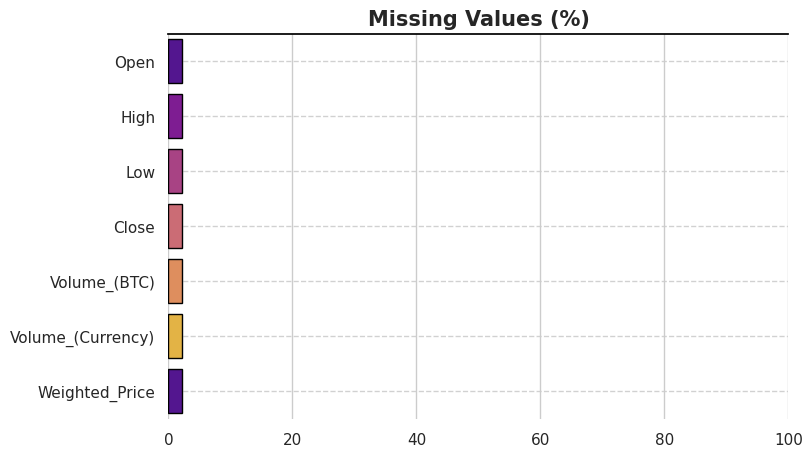

In [13]:
# Plot missing data
bar_plot(x = NaN_values,y = NaN_values.index,palette_len = NaN_values.index, 
         xlim = (0,100),xticklabels = range(0,101,20),yticklabels = NaN_values.index,
         figsize = (8,5))

In [14]:
train_df[train_df.isna().any(axis=1)]

,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
Timestamp,,,,,,,
2020-07-06 14:21:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-06 15:07:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-06 18:10:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-06 21:12:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-06 21:17:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2020-08-30 12:45:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-30 14:14:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-30 14:18:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
def forward_fill_na(ldf):
    ldf['Open'].fillna(method='ffill', inplace=True)
    ldf['High'].fillna(method='ffill', inplace=True)
    ldf['Low'].fillna(method='ffill', inplace=True)
    ldf['Close'].fillna(method='ffill', inplace=True)
    
forward_fill_na(train_df)
forward_fill_na(test_df)

In [16]:
train_df = train_df.dropna()
test_df = test_df.dropna()

In [17]:
train_df.describe()

,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
count,78251.000000,78251.0000,78251.000000,78251.000000,78251.000000,7.825100e+04,78251.000000
mean,10737.945931,10742.2837,10734.322995,10738.298851,4.661385,5.070367e+04,10738.766444
std,1107.498174,1108.9517,1106.391519,1107.592001,13.295218,1.454410e+05,1107.773862
min,9035.760000,9041.2200,9026.510000,9040.000000,0.000020,1.901695e-01,9035.111008
25%,9351.955000,9354.5750,9350.345000,9352.515000,0.202116,2.152161e+03,9352.229627
50%,11290.000000,11296.5300,11285.160000,11290.150000,1.174490,1.264981e+04,11291.357392
75%,11679.825000,11684.5100,11675.595000,11679.930000,4.156822,4.505552e+04,11680.357788
max,12450.910000,12473.0000,12436.310000,12461.680000,663.636053,7.939944e+06,12457.503516


In [18]:
#(1) Рынок поднимется (откроем длинную позицию),
#(2) Рынок упадет (откройте короткую позицию)
#(3) Рынок будет двигаться вбок (не открывать позиций).
# прогнозирования сигнала покупки (значение = 1) или продажи (значение = 0) 
# классификация - 0 и 1
# покупка - бычий, продажа - медвежий

In [19]:
#Если краткосрочная скользящая средняя (SMA1) больше долгосрочной скользящей средней (SMA2), 
#это считается сигналом на покупку (значение сигнала = 1). Иначе 0 - продажа
#. Когда краткосрочная SMA пересекает долгосрочную SMA снизу вверх, это сигнал на покупку,
# а когда сверху вниз, это сигнал на продажу.

In [20]:
#Сигнал на покупку (бычий сигнал): Когда краткосрочная скользящая средняя (SMA1) пересекает 
#   долгосрочную скользящую среднюю (SMA2) снизу вверх, это указывает на то, что недавние цены 
#   растут быстрее, чем исторические цены. Это может свидетельствовать о начале восходящего тренда.
#Сигнал на продажу (медвежий сигнал): Когда краткосрочная скользящая средняя пересекает 
#   долгосрочную скользящую среднюю сверху вниз, это указывает на то, что недавние цены падают
#   быстрее, чем исторические цены. Это может свидетельствовать о начале нисходящего тренда.

In [21]:
def create_target(ldf,tr_id=False):
    ldf['SMA1'] = ldf['Close'].rolling(window=10, min_periods=1, center=False).mean() #  short
    ldf['SMA2'] = ldf['Close'].rolling(window=60, min_periods=1, center=False).mean() #  long
    ldf['signal'] = np.where(ldf['SMA1'] > ldf['SMA2'], 1.0, 0.0) # Create signals
    
train_df1 = train_df.copy() 
test_df1 = test_df.copy()
create_target(train_df1)
create_target(test_df1)  # Add target variable to Test Set
train_df1['signal'].value_counts()

signal
1.0    40125
0.0    38126
Name: count, dtype: int64

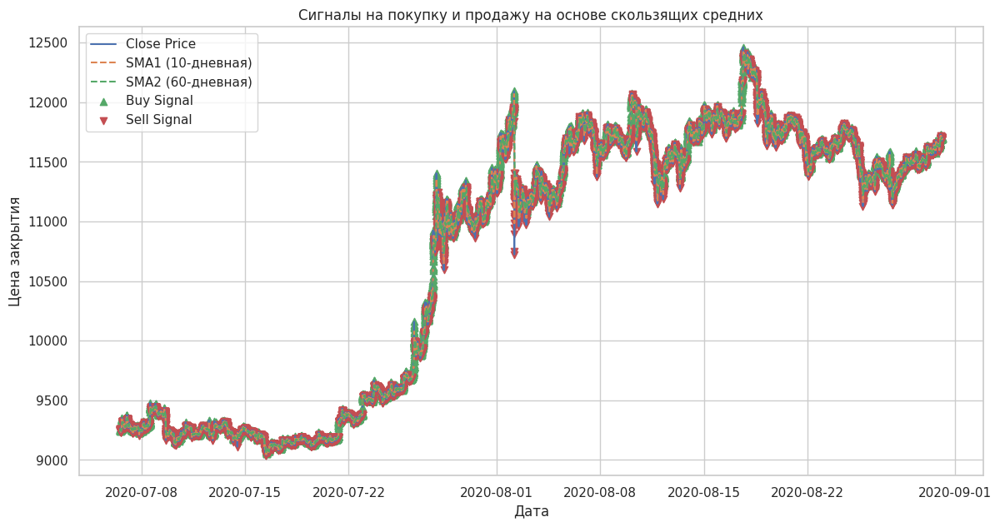

In [22]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14,7))
plt.plot(train_df1['Close'], label='Close Price')
plt.plot(train_df1['SMA1'], label='SMA1 (10-дневная)', linestyle='--')
plt.plot(train_df1['SMA2'], label='SMA2 (60-дневная)', linestyle='--')

# Отображение сигналов
buy_signals = train_df1[train_df1['signal'] == 1.0]
sell_signals = train_df1[train_df1['signal'] == 0.0]

plt.scatter(buy_signals.index, buy_signals['Close'], marker='^', color='g', label='Buy Signal', alpha=1)
plt.scatter(sell_signals.index, sell_signals['Close'], marker='v', color='r', label='Sell Signal', alpha=1)

plt.legend(loc='best')
plt.title('Сигналы на покупку и продажу на основе скользящих средних')
plt.xlabel('Дата')
plt.ylabel('Цена закрытия')
plt.grid(True)
plt.show()

In [23]:
# Создание подграфиков с общей осью X
features = ['Close', 'signal']
fig = make_subplots(rows=len(features), shared_xaxes=True)

# Добавление линий для каждого признака с разной толщиной
for i, feature in enumerate(features, start=1):
    line_width = 2 if i == 1 else 0.4  # Установка разной толщины для разных графиков
    fig.add_trace(go.Scatter(x=train_df1.index, y=train_df1[feature], mode='lines', name=feature, line=dict(width=line_width)), row=i, col=1)

# Обновление макета графика
fig.update_layout(template='plotly_white', margin=dict(l=50, r=80, t=50, b=40),title='Weighted Price & Signal Fluctional in Training Data')
fig.show()


In [24]:
fig.show()


In [25]:
def plot_line(ldf,lst,title='',sec_id=None,size=[350,1000]):
    
    # sec_id - list of [False,False,True] values of when to activate supblots; same length as lst
    
    if(sec_id is not None):
        fig = make_subplots(specs=[[{"secondary_y": True}]])
    else:
        fig = go.Figure()
        
    if(len(lst) is not 1):
        ii=-1
        for i in lst:
            ii+=1
            if(sec_id is not None):
                fig.add_trace(go.Scatter(x=ldf.index, y=ldf[lst[ii]],mode='lines',name=lst[ii],line=dict(width=2.0)),secondary_y=sec_id[ii])
            else:
                fig.add_trace(go.Scatter(x=ldf.index, y=ldf[lst[ii]],mode='lines',name=lst[ii],line=dict(width=2.0)))
    else:
        fig.add_trace(go.Scatter(x=ldf.index, y=ldf[lst[0]],mode='lines',name=lst[0],line=dict(width=2.0)))

    fig.update_layout(height=size[0],width=size[1],template='plotly_white',title=title,
                          margin=dict(l=50,r=80,t=50,b=40));fig.show()

In [26]:
# Visualise Training Set Target Variable Related Features

columns = ['SMA1','SMA2','signal']
ldf = train_df1.loc[plot_period,columns]
plot_line(ldf,columns,
          title='SM1, SMA2 & Signal created from Closing Price',
          sec_id=[False,False,True])  

In [27]:
train_df1=train_df1.drop(['SMA1','SMA2'], axis=1)
test_df1=test_df1.drop(['SMA1','SMA2'], axis=1)

In [28]:
train_df1_corr=train_df1.corr()
train_df1_corr['signal']

Open                 0.014482
High                 0.014498
Low                  0.014674
Close                0.014555
Volume_(BTC)         0.000543
Volume_(Currency)    0.000075
Weighted_Price       0.014644
signal               1.000000
Name: signal, dtype: float64

In [29]:
train_df2 = train_df1.copy()  # Create duplicate dataframe & add features to it
test_df2 = test_df1.copy()

In [30]:
# %1)K (быстрый стохастический осциллятор
# %K представляет собой текущую позицию закрытия актива в пределах 
# диапазона его цен за определенный период времени
    
# %D (медленный стохастический осциллятор)
# %D представляет собой скользящее среднее по значениям %K.

# 2)Индекс относительной силы (RSI) - это технический индикатор, 
# используемый для оценки степени, в которой актив считается 
# перекупленным или перепроданным на рынке. 

# 3) Перекупленный - значит много купили, скоро упадет

# перепроданный - много продали, скоро возрастет

In [31]:
# ROC выражается в процентах и показывает относительное изменение цены актива за определенный период времени. Более высокие значения ROC указывают на
# более быстрое изменение цены вверх, тогда как более низкие значения ROC указывают на более медленное изменение или даже снижение цены актива.

# Активы с высокими значениями ROC могут считаться более перекупленными, поскольку их цена быстро возрастает и может стать завышенной, в то время как 
# активы с низкими значениями ROC могут считаться более перепроданными, поскольку их цена снижается или изменяется медленнее.

In [32]:
# Принимая значения в диапазоне от 0 до 100, RSI позволяет определить степень, в которой цены актива изменялись вверх или вниз за определенный период времени.
# Более высокие значения RSI указывают на более сильный восходящий тренд, в то время как более низкие значения RSI указывают на сильный нисходящий тренд.

# Основные уровни RSI, которые часто используются в анализе, - это 70 и 30. Значение RSI выше 70 часто интерпретируется как сигнал о том, что актив перекуплен,
# то есть цена актива, вероятно, слишком высока и может скоро начать снижаться. С другой стороны, значение RSI ниже 30 может указывать на то, что актив недопродан 
# и недооценен,
# что может быть сигналом для возможного повышения цены.

In [33]:
#Импульс (MOM): это скорость ускорения цены или объема ценной бумаги; скорость изменения цены.

In [34]:
#Включить признаки с высокой линейной корреляцией с целевой переменной: Это помогает захватить основное 
#направление зависимости.
#Включить признаки с возможными нелинейными зависимостями: Это помогает модели захватывать сложные паттерны.
#Включить признаки, которые не сильно коррелируют между собой: Это помогает избежать дублирования 
#информации и улучшает обобщающую способность модели.

In [35]:
''' Technical Indicators '''

#Calculation of moving average
def ma(df, n):
    return pd.Series(df['Close'].rolling(n, min_periods=n).mean(), name='MA_' + str(n))

# exponentially weighted moving average 
def ema(df, n):
    return pd.Series(df['Close'].ewm(span=n,min_periods=n).mean(), name='EMA_' + str(n))

#Calculation of price momentum
def mom(df, n):     
    return pd.Series(df.diff(n), name='Momentum_' + str(n))  

# rate of change
def roc(df, n):  # Показывает на сколько процентов цена увеличилась/уменьшилась
    M = df.diff(n - 1) ; N = df.shift(n - 1)  
    return pd.Series(((M / N) * 100), name = 'ROC_' + str(n)) 

# relative strength index
def rsi(df, period): # значение перекупленности или перепроданности от 0 до 100
    delta = df.diff().dropna()
    u = delta * 0; d = u.copy()
    u[delta > 0] = delta[delta > 0]; d[delta < 0] = -delta[delta < 0]
    u[u.index[period-1]] = np.mean( u[:period] ) #first value is sum of avg gains
    u = u.drop(u.index[:(period-1)])
    d[d.index[period-1]] = np.mean( d[:period] ) #first value is sum of avg losses
    d = d.drop(d.index[:(period-1)])
    rs = u.ewm(com=period-1, adjust=False).mean() / d.ewm(com=period-1, adjust=False).mean()
    return 100 - 100 / (1 + rs)

# stochastic oscillators slow & fast
def sto(close, low, high, n,id): 
    stok = ((close - low.rolling(n).min()) / (high.rolling(n).max() - low.rolling(n).min())) * 100
    if(id is 0):
        return stok
    else:
        return stok.rolling(3).mean()
# %K близко к 0 указывает на то, что текущая цена ближе к минимальной цене за период, 
# что может сигнализировать о перепроданности рынка.
# %K близко к 100 указывает на то, что текущая цена ближе к максимальной цене за период,
# что может сигнализировать о перекупленности рынка.

In [36]:
def tech_indi(ldf,tr_id=True):

    ''' Moving Average '''
    ldf['MA21'] = ma(ldf,10)
    ldf['MA63'] = ma(ldf, 30)
    ldf['MA252'] = ma(ldf, 200)
    lst_MA = ['MA21','MA63','MA252']

    ''' Exponentially Weighted Moving Average '''
    ldf['EMA10'] = ema(ldf, 10)
    ldf['EMA30'] = ema(ldf, 30)
    ldf['EMA200'] = ema(ldf, 200)
    lst_EMA = ['EMA10','EMA30','EMA200']

    ''' Momentum '''
    ldf['MOM10'] = mom(ldf['Close'], 10)
    ldf['MOM30'] = mom(ldf['Close'], 30)
    lst_MOM = ['MOM10','MOM30']

    ''' Relative Strength Index '''
    ldf['RSI10'] = rsi(ldf['Close'], 10)
    ldf['RSI30'] = rsi(ldf['Close'], 30)
    ldf['RSI200'] = rsi(ldf['Close'], 200)
    lst_RSI = ['RSI10','RSI30','RSI200']

    ''' Slow Stochastic Oscillators '''
    ldf['%K10'] = sto(ldf['Close'], ldf['Low'], ldf['High'],5,0)
    ldf['%K30'] = sto(ldf['Close'], ldf['Low'], ldf['High'],10,0)
    ldf['%K200'] = sto(ldf['Close'], ldf['Low'], ldf['High'], 20,0)
    lst_pK = ['%K10','%K30','%K200']

    ''' Fast Stochastic Oscillators '''
    ldf['%D10'] = sto(ldf['Close'], ldf['Low'], ldf['High'], 10,1)
    ldf['%D30'] = sto(ldf['Close'], ldf['Low'], ldf['High'], 30,1)
    ldf['%D200'] = sto(ldf['Close'], ldf['Low'], ldf['High'], 200,1)
    lst_pD = ['%D10','%D30','%D200']
    
    # Plot Training Data
    if(tr_id):
        plot_line(ldf.loc[plot_period,lst_MA],lst_MA,title='Moving Average (window=21,63,252)')
        plot_line(ldf.loc[plot_period,lst_EMA],lst_EMA,title='Exponential Moving Average (window=10,30,200)')
        plot_line(ldf.loc[plot_period,lst_MOM],lst_MOM,title='Momentum')
        plot_line(ldf.loc[plot_period,lst_RSI],lst_RSI,title='Relative Strength Index')
        plot_line(ldf.loc[plot_period,lst_pK],lst_pK,title='Stochastic Oscillators (slow)')
        plot_line(ldf.loc[plot_period,lst_pD],lst_pD,title='Stochastic Oscillators (Fast)')

In [37]:
tech_indi(train_df2)
tech_indi(test_df2,tr_id=False)

In [38]:
train_df2.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume_(BTC)', 'Volume_(Currency)',
       'Weighted_Price', 'signal', 'MA21', 'MA63', 'MA252', 'EMA10', 'EMA30',
       'EMA200', 'MOM10', 'MOM30', 'RSI10', 'RSI30', 'RSI200', '%K10', '%K30',
       '%K200', '%D10', '%D30', '%D200'],
      dtype='object')

In [39]:
train_df2_corr=train_df2.corr()
train_df2_corr['signal'].sort_values(ascending=False)

signal               1.000000
RSI30                0.651428
%D30                 0.559268
%D200                0.557046
MOM30                0.491835
RSI10                0.400472
RSI200               0.398982
%K200                0.303474
MOM10                0.200065
%D10                 0.154909
%K30                 0.087360
Low                  0.014674
Weighted_Price       0.014644
Close                0.014555
High                 0.014498
Open                 0.014482
MA21                 0.013182
EMA10                0.012790
EMA30                0.007330
MA63                 0.006434
%K10                 0.003169
Volume_(BTC)         0.000543
Volume_(Currency)    0.000075
EMA200              -0.001816
MA252               -0.003270
Name: signal, dtype: float64

In [40]:
train_df2.drop(['High','Low','Open','Volume_(Currency)'], axis=1)
test_df2.drop(['High','Low','Open','Volume_(Currency)'], axis=1)

,Close,Volume_(BTC),Weighted_Price,signal,MA21,MA63,MA252,EMA10,EMA30,EMA200,...,MOM30,RSI10,RSI30,RSI200,%K10,%K30,%K200,%D10,%D30,%D200
Timestamp,,,,,,,,,,,,,,,,,,,,,
2020-08-31 02:41:00+00:00,11687.10,2.027577,11685.904577,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-31 02:42:00+00:00,11682.69,5.168273,11682.224156,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-31 02:43:00+00:00,11683.07,0.015893,11683.000919,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-31 02:44:00+00:00,11682.76,0.181907,11683.532710,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-31 02:45:00+00:00,11684.54,0.351306,11691.183378,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,25.864553,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-09-13 23:56:00+00:00,10325.89,0.081143,10324.419779,1.0,10321.618,10321.485333,10312.79165,10322.555695,10320.679941,10310.994579,...,4.57,58.349895,54.535785,51.130491,99.837134,81.377899,81.377899,70.327422,45.734084,72.111924
2020-09-13 23:57:00+00:00,10331.97,0.572817,10331.444396,1.0,10323.419,10321.804667,10312.96860,10324.267387,10321.408331,10311.203290,...,9.58,66.408555,57.613792,51.528107,100.000000,100.000000,100.000000,81.650750,57.759492,77.773644
2020-09-13 23:58:00+00:00,10331.47,2.489909,10326.175283,1.0,10324.656,10322.012000,10313.13625,10325.576953,10322.057471,10311.404948,...,6.22,65.254879,57.283862,51.493479,95.499550,96.025437,97.223765,92.467779,69.582792,83.954196


In [41]:
NaN_values = (train_df2.isnull().sum() / len(train_df2) * 100).sort_values(ascending = False)
NaN_values

%D200                0.256866
RSI200               0.255588
EMA200               0.254310
MA252                0.254310
%D30                 0.039616
RSI30                0.038338
MOM30                0.038338
MA63                 0.037060
EMA30                0.037060
%K200                0.024281
%D10                 0.014057
MOM10                0.012779
RSI10                0.012779
MA21                 0.011501
EMA10                0.011501
%K30                 0.011501
%K10                 0.008946
signal               0.000000
High                 0.000000
Weighted_Price       0.000000
Volume_(Currency)    0.000000
Volume_(BTC)         0.000000
Close                0.000000
Low                  0.000000
Open                 0.000000
dtype: float64

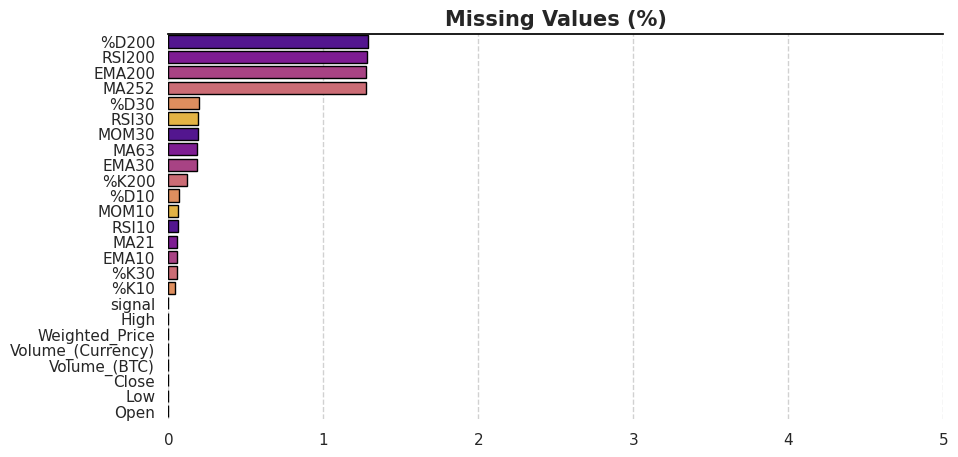

In [42]:
bar_plot(x = NaN_values,y = NaN_values.index,palette_len = NaN_values.index, 
         xlim = (0,1),xticklabels = range(0,10),yticklabels = NaN_values.index,
         figsize = (10,5), axis_grid = 'x')

In [43]:
train_df2 = train_df2.dropna() 
test_df2 = test_df2.dropna()

In [44]:
models = []
# Lightweight Models 
models.append(('LDA', LinearDiscriminantAnalysis()))  # Unsupervised Model 
models.append(('KNN', KNeighborsClassifier()))  # Unsupervised Model
models.append(('TREE', DecisionTreeClassifier())) # Supervised Model
models.append(('NB', GaussianNB())) # Unsupervised Model

# More Advanced Models
models.append(('GBM', GradientBoostingClassifier(n_estimators=25)))
models.append(('XGB',XGBClassifier(n_estimators=25,eval_metric='logloss')))
models.append(('CAT',CatBoostClassifier(silent=True,
                                        n_estimators=25)))
models.append(('RF', RandomForestClassifier(n_estimators=25)))

In [45]:
models[0]

('LDA', LinearDiscriminantAnalysis())

In [46]:
#eval_id[0]: Кросс-Валидация. Получить более надежную и обобщенную оценку производительности модели, проверяя ее на разных частях данных.
#eval_id[1]: Проверить, как хорошо модель обучается на предоставленных данных и насколько она переобучена (overfitting).
# Учимся и предсказываем на тестовых данных
#eval_id[2]: Обучаемся на тестовых данных проверяем на валидационных данных.
#eval_id[3]: Обучаемся и проверяем на всез данных

In [47]:
def modelEval(ldf,feature='signal',test_value=None,eval_id=[True,True,True,True],
              n_fold=5,scoring='accuracy',plot_id=[True,True]):
    
    print('Evaluation Function')
    print(f'Cross Validation Activated, n_splits : {n_fold}, scoring metric: {scoring}')
    
    ''' 1. Split Train/Evaluation <DataFrame> Set Split '''
        
    tr_df,eval_df = train_test_split(ldf,test_size=test_value,shuffle=False)

        
    ''' 2. Train/Test Feature Matrices + Target Variables Split'''
    
    y_train = tr_df[feature]
    X_train = tr_df.loc[:, tr_df.columns != feature]
    y_eval = eval_df[feature]
    X_eval = eval_df.loc[:, eval_df.columns != feature]
    X_one = pd.concat([X_train,X_eval],axis=0)
    y_one = pd.concat([y_train,y_eval],axis=0)
    
    print('');print(f'Using Features: {X_train.columns}')
    print(f'Target Variable: {feature}');print('')
        
    ''' 3. Visualise Training/Test Data'''
    if(plot_id[0]):
        
        # plot the training data
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=tr_df.index, y=tr_df['signal'],mode='lines',name='Training Data', line={'width': 0.25}))
        fig.update_layout(height=300,width=800,template='plotly_white',title='Training Signal Visualisation',
                          margin=dict(l=50,r=80,t=50,b=40))
        
        # Plot the test data as well 
        if(eval_id[2]):
            fig.add_trace(go.Scatter(x=eval_df.index, y=eval_df['signal'],mode='lines',name='Test Data',line={'width': 0.25}))
            fig.update_layout(title='Training/Test Signal Visualisation')
        fig.show()
    
    ''' 4. Cross Validation, Training/Evaluation, one evaluation'''
    lst_res = []; names = []; lst_train = []; lst_eval = []; lst_one = []; lst_res_mean = []
    if(any(eval_id)):
        for name, model in models:  # cycle through models & evaluate either cv or train/test
            names.append(name)
            
            # Cross Validation Model on Training Se
            if(eval_id[0]):
                t0=time.time()
                kfold = KFold(n_splits=n_fold)
                cv_res = cross_val_score(model,X_train,y_train, cv=kfold, scoring=scoring)
                t1 = time.time()
                lst_res.append(cv_res)
                tt1 = t1-t0 # total time for n_fold cross evaluation
                
            # Evaluate Fit Model on Training Data
            t2 = time.time()
            if(eval_id[1]):
                t2 = time.time()
                res = model.fit(X_train,y_train)
                train_res = accuracy_score(res.predict(X_train),y_train); lst_train.append(train_res)
            if(eval_id[2]):
                if(eval_id[1] is False):  # If training hasn't been called yet
                    res = model.fit(X_train,y_train)
                eval_res = accuracy_score(res.predict(X_eval),y_eval); lst_eval.append(eval_res)
            t3 = time.time()
            tt2 = t3-t2 # total time for training/evaluation train/prediction
            
            # Evaluate model on entire dataset
            if(eval_id[3]):
                t4 = time.time()
                res = model.fit(X_one,y_one)
                one_res = accuracy_score(res.predict(X_one),y_one); lst_one.append(one_res)
                t5 = time.time()
                tt3 = t5-t4 # total time for training & evaluation on whole dataframe
            
            ''' [out] Verbal Outputs '''
            # Cross Validation / Training / Evaluation Model Evaluation / Section Times
            lst_res_mean.append(cv_res.mean())
            fn1 = cv_res.mean(); fn2 = cv_res.std();
            fn3 = train_res; fn4 = eval_res; fn5 = one_res
            print(f"{name} : {fn1:.3f}({fn2:.3f}) -> {tt1:.2f}s | {fn3:.3f} & {fn4:.3f} -> {tt2:.2f}s | {fn5:.3f} -> {tt3:.2}s")
      
    s0 = pd.Series(np.array(lst_res_mean),index=names)
    s1 = pd.Series(np.array(lst_train),index=names)
    s2 = pd.Series(np.array(lst_eval),index=names)
    s3 = pd.Series(np.array(lst_one),index=names)
    pdf = pd.concat([s0,s1,s2,s3],axis=1)
    pdf.columns = ['cv_average','train','test','all']
        
    ''' 5. Visual Ouputs '''
    if(plot_id[1]): 
        
        sns.set(style="whitegrid")
        fig,ax = plt.subplots(1,2,figsize=(15,4))
        ax[0].set_title(f'{n_fold} Cross Validation Results')
        sns.boxplot(data=lst_res, ax=ax[0], orient="v",width=0.3)
        ax[0].set_xticklabels(names)
        sns.stripplot(data=lst_res,ax=ax[0], orient='v',color=".3")
    
        sns.heatmap(pdf,ax=ax[1],annot=True,fmt='.3f',cmap='Blues')
        ax[1].set_title('Accuracy Scores')
        plt.show()

Evaluation Function
Cross Validation Activated, n_splits : 5, scoring metric: accuracy

Using Features: Index(['Open', 'High', 'Low', 'Close', 'Volume_(BTC)', 'Volume_(Currency)',
       'Weighted_Price'],
      dtype='object')
Target Variable: signal



LDA : 0.513(0.014) -> 0.35s | 0.522 & 0.513 -> 0.08s | 0.522 -> 0.16s
KNN : 0.501(0.003) -> 3.56s | 0.698 & 0.503 -> 4.00s | 0.698 -> 4.2s
TREE : 0.505(0.010) -> 5.20s | 1.000 & 0.509 -> 1.38s | 1.000 -> 1.6s
NB : 0.508(0.018) -> 0.10s | 0.516 & 0.503 -> 0.03s | 0.514 -> 0.034s
GBM : 0.508(0.019) -> 21.67s | 0.551 & 0.510 -> 5.46s | 0.541 -> 7.0s
XGB : 0.496(0.010) -> 0.91s | 0.613 & 0.524 -> 0.17s | 0.604 -> 0.18s
CAT : 0.498(0.015) -> 1.05s | 0.574 & 0.502 -> 0.23s | 0.570 -> 0.27s
RF : 0.500(0.014) -> 26.66s | 0.998 & 0.511 -> 7.19s | 0.998 -> 9.3s


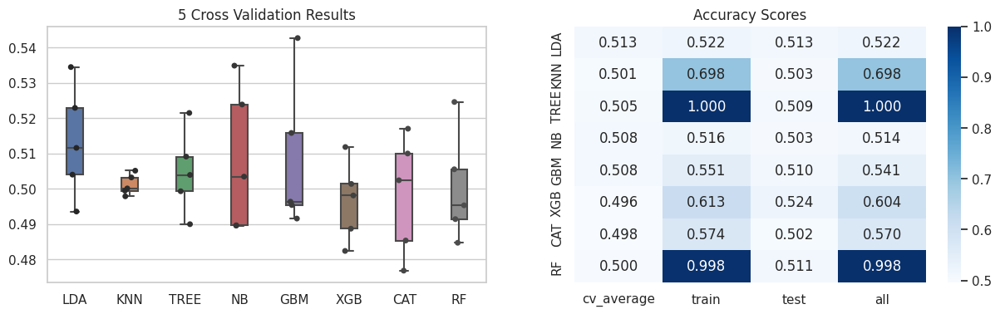

In [48]:
# Проверим модель без Feature Engineering
modelEval(train_df1,test_value=0.2)
# Вывод: 1) CV - CV.STD - TIME 2) модель обучена на обучающей и проверена на тестовых - accuracy train & test - time
# 3) acurracy - time(модель обучена на всех данных, предсказывает на тех же всех данных)

Evaluation Function
Cross Validation Activated, n_splits : 5, scoring metric: accuracy

Using Features: Index(['Open', 'High', 'Low', 'Close', 'Volume_(BTC)', 'Volume_(Currency)',
       'Weighted_Price', 'MA21', 'MA63', 'MA252', 'EMA10', 'EMA30', 'EMA200',
       'MOM10', 'MOM30', 'RSI10', 'RSI30', 'RSI200', '%K10', '%K30', '%K200',
       '%D10', '%D30', '%D200'],
      dtype='object')
Target Variable: signal



LDA : 0.906(0.017) -> 0.82s | 0.908 & 0.927 -> 0.22s | 0.910 -> 0.22s
KNN : 0.577(0.016) -> 10.47s | 0.783 & 0.640 -> 15.14s | 0.794 -> 1.7e+01s
TREE : 0.868(0.018) -> 10.03s | 1.000 & 0.894 -> 2.61s | 1.000 -> 3.4s
NB : 0.761(0.012) -> 0.19s | 0.762 & 0.789 -> 0.06s | 0.768 -> 0.075s
GBM : 0.893(0.006) -> 65.81s | 0.897 & 0.905 -> 16.83s | 0.900 -> 2.2e+01s
XGB : 0.918(0.007) -> 2.19s | 0.941 & 0.931 -> 0.46s | 0.940 -> 0.53s
CAT : 0.914(0.009) -> 2.30s | 0.925 & 0.930 -> 0.52s | 0.925 -> 0.61s
RF : 0.902(0.011) -> 30.68s | 0.999 & 0.918 -> 8.29s | 1.000 -> 1.1e+01s


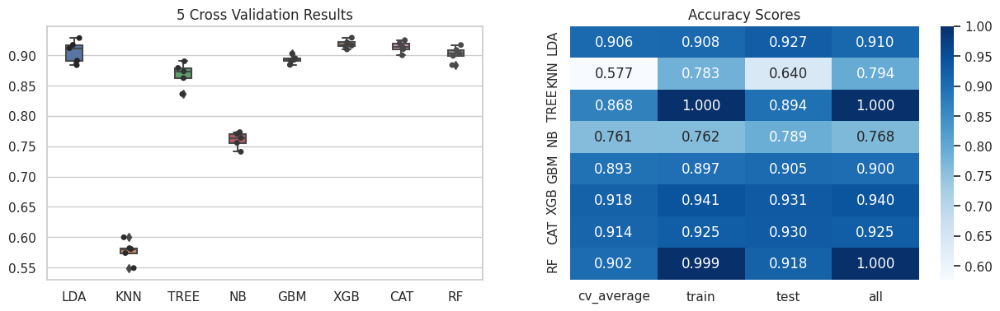

In [49]:
# Проверим модель с Feature Engineering
modelEval(train_df2,test_value=0.2)

In [50]:
# Мы сделали feature engeneering и удалили некоторые признаки; попробуем определить наиболее важные признаки и
# остальные отбросим

#1)Уменьшение размерности за счет важности функций

    
# Linear Correlation w/ abs() function.
# SHAP Values of Catboost Regression Model (n_est)
# RandomForest Regressor (n_est)
# XGBoost Regressor (n_est)
# CatBoost Regressor (n_est)
# SelectKBest (k)

# The indivual scores are combined and scaled using MinMaxScaler() & Plot.
# The y-axis represents the total score (higher score is better, max -> Number of approaches).
# he x-axis represents the corresponding features of input dataframe.


In [51]:
from sklearn.feature_selection import SelectKBest,f_regression
from xgboost import plot_importance,XGBRegressor
from catboost import CatBoostClassifier,CatBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn import preprocessing
import shap
import seaborn as sns

cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Plot Correlation to Target Variable only
def corrMat(df,target='signal',figsize=(9,0.5),ret_id=False):
    
    corr_mat = df.corr().round(2)
    shape = corr_mat.shape[0]
    corr_mat = corr_mat.transpose()
    corr = corr_mat.loc[:, df.columns == target].transpose().copy()
    
    if(ret_id):
        return corr

''' Feature Importance '''
# Various Approaches for quick FI evaluation

def fi(ldf,target='signal',n_est=25,num_only=True,
       drop_id=None,target_cat=True,drop_na=False):
    
    # Select only numerical features
    if(num_only):
        ldf = ldf.select_dtypes(include=['float64','int64'])    
    
    # Drop all NaN
    if(drop_na):
        print(f'Before NaN drop: {ldf.shape}')
        ldf = ldf.dropna()
        print(f'After NaN dropped: {ldf.shape}')
    
    
    ldf = ldf.copy()
    # If target is categorical string variable
    if(target_cat):
        cats = ldf[target].unique()
        cats_id = [i for i in range(0,len(cats))]
        maps = dict(zip(cats,cats_id))    
        ldf[target] = ldf[target].map(maps)
    
    # If any features are desired to be droped 
    if(drop_id is not None):
        ldf = ldf.drop(drop_id,axis=1)

    # Input dataframe containing feature & target variable
    y = ldf[target]
    X = ldf.drop(target,axis=1)
    
#   CORRELATION
    imp = corrMat(ldf,target,figsize=(15,0.5),ret_id=True)
    del imp[target]
    s1 = imp.squeeze(axis=0);s1 = abs(s1)
    s1.name = 'CORR'

    
#   SHAP
    model = CatBoostRegressor(silent=True,n_estimators=n_est).fit(X,y)
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X)
    shap_sum = np.abs(shap_values).mean(axis=0)
    s2 = pd.Series(shap_sum,index=X.columns,name='CAT_SHAP').T

    
#   CATBOOST
    model = CatBoostRegressor(silent=True,n_estimators=n_est).fit(X,y)
    fit = model.fit(X,y)
    rf_fi = pd.DataFrame(model.feature_importances_,index=X.columns,
                                         columns=['CAT'])
    rf_fi.sort_values('CAT',ascending=False)
    s3 = rf_fi.T.squeeze(axis=0)

    
#   RANDOMFOREST
    model = RandomForestRegressor(n_est,random_state=0, n_jobs=-1)
    fit = model.fit(X,y)
    rf_fi = pd.DataFrame(model.feature_importances_,index=X.columns,
                                         columns=['RF'])
    rf_fi.sort_values('RF',ascending=False)
    s4 = rf_fi.T.squeeze(axis=0)


#   XGB 
    model=XGBRegressor(n_estimators=n_est,learning_rate=0.5,verbosity = 0)
    model.fit(X,y)
    data = model.feature_importances_
    s5 = pd.Series(data,index=X.columns,name='XGB').T


# KBEST
    model = SelectKBest(k=5, score_func=f_regression)
    fit = model.fit(X,y)
    data = fit.scores_
    s6 = pd.Series(data,index=X.columns,name='KBEST')

    # Combine Scores
    df0 = pd.concat([s1,s2,s3,s4,s5,s6],axis=1)
    df0.rename(columns={'target':'lin corr'})

    # MinMax Scaler
    x = df0.values 
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(x)
    df = pd.DataFrame(x_scaled,index=df0.index,columns=df0.columns)
    df = df.rename_axis(f'<b>FI APPROACH</b>', axis=1)
    df = df.rename_axis('Feature', axis=0)
    
    pd.options.plotting.backend = "plotly"
    fig = df.plot(kind='bar',title='<b>SCALED FEATURE IMPORTANCE</b>',
                  color_discrete_sequence=px.colors.qualitative.T10)
    fig.update_layout(template='plotly_white',height=400,
                     font=dict(family='sans-serif',size=12),
                     margin=dict(l=60, r=40, t=50, b=10))
    fig.update_traces(width=0.25)
    fig.show()

In [52]:
fi(train_df2)

In [53]:
train_df2_FI = train_df2.drop(columns=['Open','High','Low','Close','Volume_(BTC)','Volume_(Currency)','Weighted_Price','MA63','EMA10','%K10'])

In [54]:
train_df2_FI

,signal,MA21,MA252,EMA30,EMA200,MOM10,MOM30,RSI10,RSI30,RSI200,%K30,%K200,%D10,%D30,%D200
Timestamp,,,,,,,,,,,,,,,
2020-07-06 16:44:00+00:00,0.0,9308.804,9270.58205,9313.502230,9286.260411,10.15,-27.55,53.902809,52.367457,53.440501,91.228070,62.489270,83.300958,31.392842,65.776666
2020-07-06 16:45:00+00:00,0.0,9308.862,9270.86880,9313.253054,9286.528215,0.58,-40.35,46.579852,50.334584,53.064741,65.771266,46.237482,78.110502,30.951957,65.104461
2020-07-06 16:46:00+00:00,0.0,9308.696,9271.19630,9312.705114,9286.736739,-1.66,-42.81,41.232446,48.655862,52.744508,45.909646,32.274678,67.636327,28.342309,63.367481
2020-07-06 16:47:00+00:00,0.0,9309.788,9271.52620,9312.589945,9287.012923,10.92,-28.51,49.382559,50.798623,53.103544,60.498615,49.899857,57.393176,27.937481,62.184399
2020-07-06 16:48:00+00:00,0.0,9310.539,9271.83910,9312.519626,9287.292165,7.51,-27.48,50.106453,50.997813,53.137237,54.482279,59.649123,53.630180,31.521616,62.684520
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-08-31 02:36:00+00:00,1.0,11698.162,11698.68500,11695.495107,11689.600262,15.93,1.40,56.829430,52.411007,51.426560,89.186047,90.596562,57.228806,66.246499,40.856624
2020-08-31 02:37:00+00:00,1.0,11698.064,11698.67295,11695.508326,11689.660956,-0.98,-0.13,49.621406,50.034614,51.031802,44.069767,51.365015,57.777314,68.029030,41.676920
2020-08-31 02:38:00+00:00,1.0,11697.810,11698.65830,11695.619402,11689.736269,-2.54,-8.96,50.983394,50.492461,51.106173,46.447368,58.951084,59.901061,71.759613,43.393684


Evaluation Function
Cross Validation Activated, n_splits : 5, scoring metric: accuracy

Using Features: Index(['MA21', 'MA252', 'EMA30', 'EMA200', 'MOM10', 'MOM30', 'RSI10', 'RSI30',
       'RSI200', '%K30', '%K200', '%D10', '%D30', '%D200'],
      dtype='object')
Target Variable: signal



LDA : 0.903(0.013) -> 0.61s | 0.904 & 0.923 -> 0.17s | 0.906 -> 0.16s
KNN : 0.769(0.037) -> 5.46s | 0.944 & 0.833 -> 6.95s | 0.944 -> 7.1s
TREE : 0.869(0.017) -> 5.82s | 1.000 & 0.894 -> 1.52s | 1.000 -> 1.9s
NB : 0.776(0.010) -> 0.15s | 0.776 & 0.797 -> 0.05s | 0.780 -> 0.053s
GBM : 0.893(0.005) -> 38.63s | 0.898 & 0.905 -> 9.81s | 0.900 -> 1.3e+01s
XGB : 0.919(0.007) -> 1.57s | 0.940 & 0.930 -> 0.30s | 0.938 -> 0.35s
CAT : 0.915(0.008) -> 1.37s | 0.922 & 0.927 -> 0.32s | 0.922 -> 0.38s
RF : 0.907(0.007) -> 22.89s | 1.000 & 0.922 -> 6.15s | 0.999 -> 8.0s


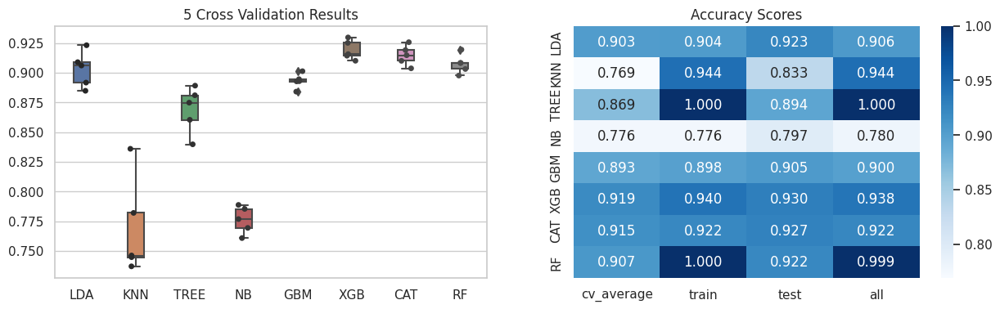

In [55]:
modelEval(train_df2_FI,test_value=0.2)